In [1]:
import numpy as np
from ImageFrame import Frame
import cv2 as cv
import timeit
import matplotlib.pyplot as plt


In [2]:
#preparing the frame
%time 

frame1 = Frame(1280,720,10)
frame1.fline['1'].shape

CPU times: total: 0 ns
Wall time: 0 ns
load CVS file successfully


(640, 2)

In [3]:
"""def function1():
    for t in range(0,data.shape[0],kernal.size+steps):
        datas_segment = data[t:t+kernal.size,:]
        dot_result = kernal.dot(datas_segment)
        detection_result = np.argmax(np.where(np.abs(dot_result)> 50,1,0))"""
def function2(data,kernal,steps,T_hold):
    offset = (data.size-9)%(kernal.size+steps)
    points = np.empty([0,2])
    #print(offset)
    #boundary_index = np.empty([0,0])
    for i in range(0,data.shape[1]):
        detection = False
        for t in range(20,data.shape[0]-offset,kernal.size+steps):
            datas_segment = data[t:t+kernal.size,i]
            dot_result = kernal.dot(datas_segment)
            #print(dot_result)
            if np.abs(dot_result) > T_hold:
                #print(t)
                points=np.append(points,[frame1.fline[str(i+1)][t]],axis=0)
                #boundary_index += [t]
                detection = True
                break
        if not detection:
            points=np.append(points,[[0,0]],axis=0)
            #boundary_index += [0]
            detection = False
    return points

def ploting_onImage(bourndary_index,frame1,img,id=0):
    plt.imshow(img)
    for key in frame1.fline.keys():
        plt.plot(frame1.fline[key][:,0],frame1.fline[key][:,1],'k.')
    plt.title("Image {num}".format(num=id))
    plt.plot(bourndary_index[:,0],bourndary_index[:,1],"ro")
    plt.show()
    
def ploting_onGraph(boundary_index,data):
    for i,j in enumerate(boundary_index[:,0]):
        plt.plot(range(0,data.shape[0]),data[:,i],'k.')
        if not i%2:
            plt.plot([j-data.shape[0],j-data.shape[0]],[0,160],'r-')
            #print(f'{j}-{data.shape[0]}={j-data.shape[0]}')
        else:
            plt.plot([data.shape[0]-j,data.shape[0]-j],[0,160],'r-')

        plt.show()

In [4]:
filename = "TestingImage/Image3.jpg"
img1 = cv.imread(filename)
img = img1[:,:,0]
print("loaded image") #image with row of 720 and 1280 column and 3 channels

loaded image


[[1232.  621.]
 [  52.  622.]
 [1154.  537.]
 [ 187.  560.]
 [1079.  470.]
 [ 262.  506.]
 [1010.  412.]
 [ 325.  459.]]


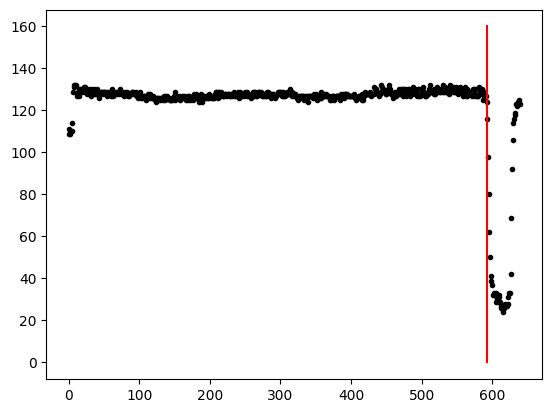

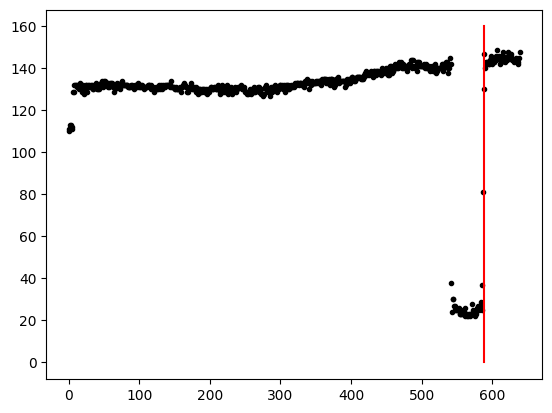

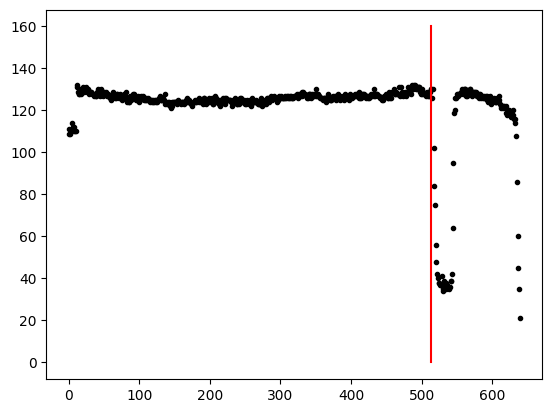

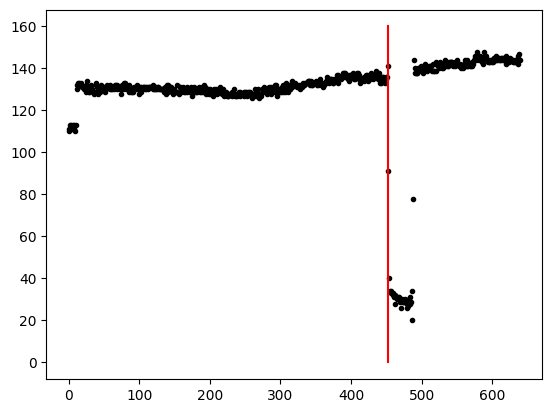

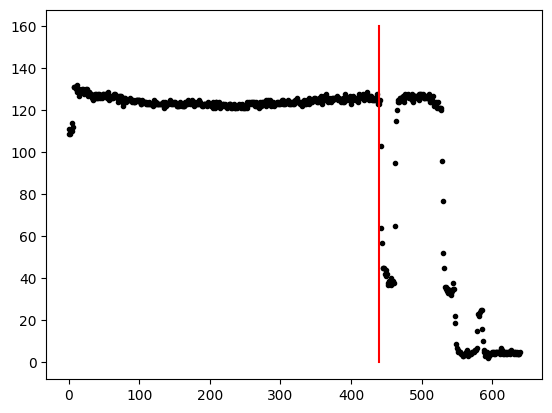

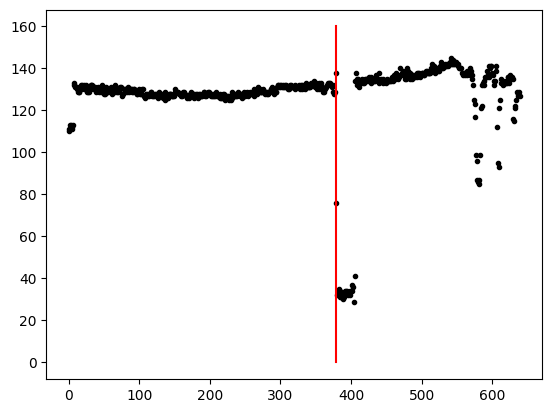

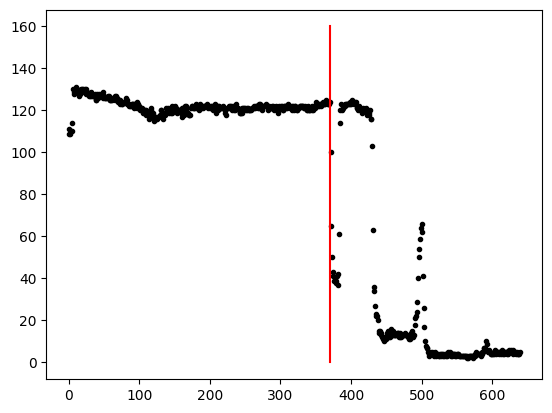

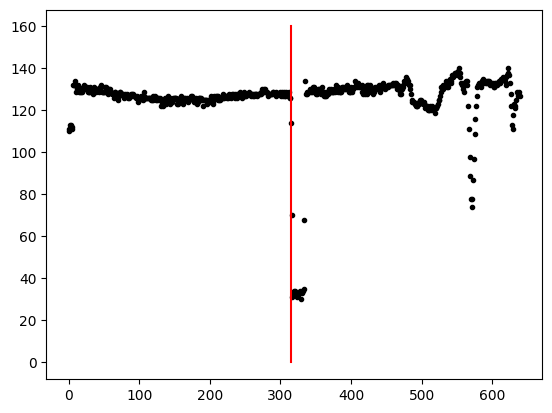

In [5]:
data = frame1.get_data(img)
kernal = np.array([-1,0,1])
b = function2(data,kernal,0,20)  #19 or 20 sensitivity is the best performance
print(b)
ploting_onGraph(b,data)

loaded image
time 0.09916360001079738


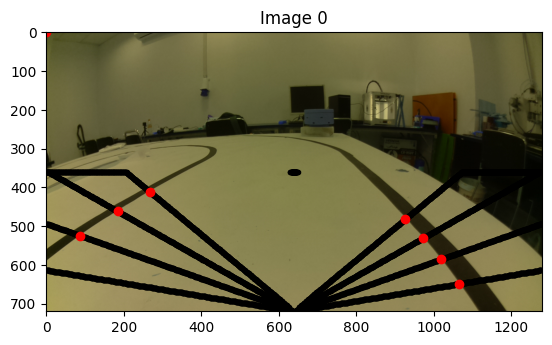

loaded image
time 0.045153999992180616


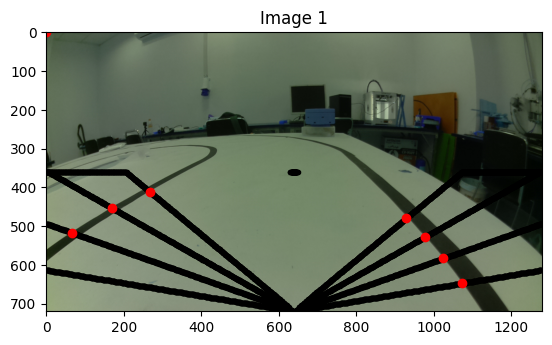

loaded image
time 0.05863259999023285


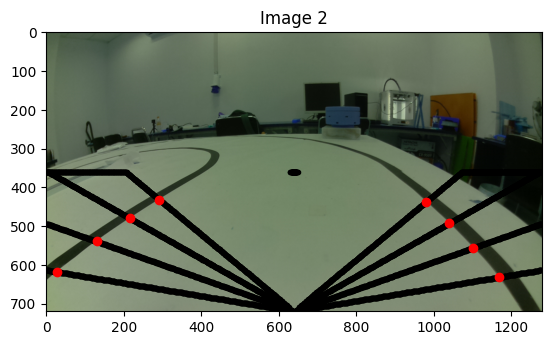

loaded image
time 0.052540400007274


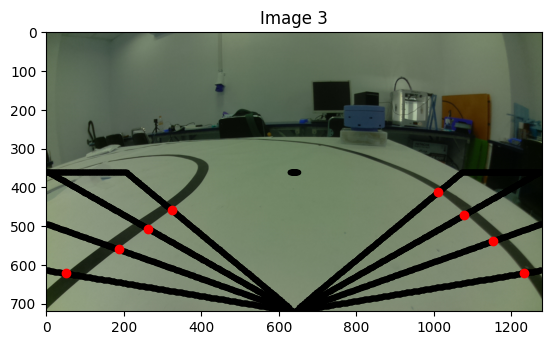

loaded image
time 0.08665829998790286


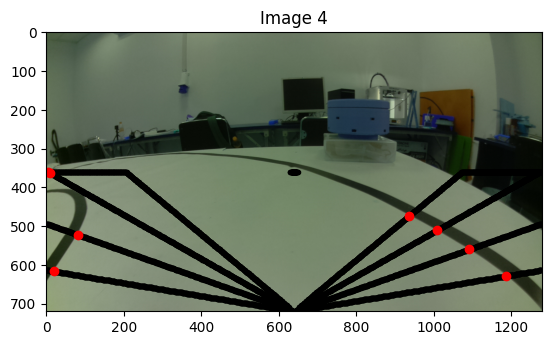

loaded image
time 0.050904999996419065


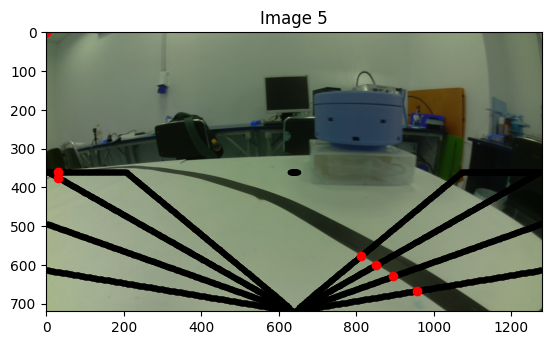

loaded image
time 0.04567190000670962


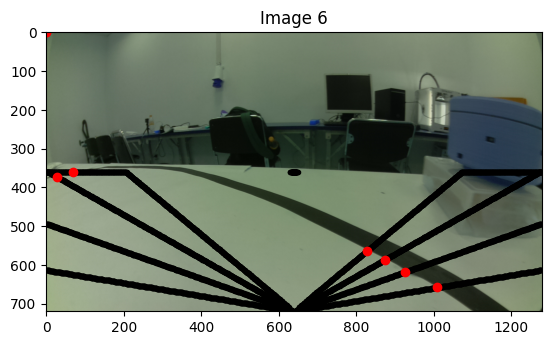

loaded image
time 0.045963700002175756


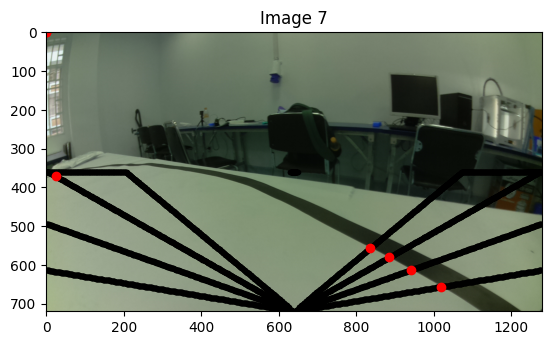

loaded image
time 0.0916706999996677


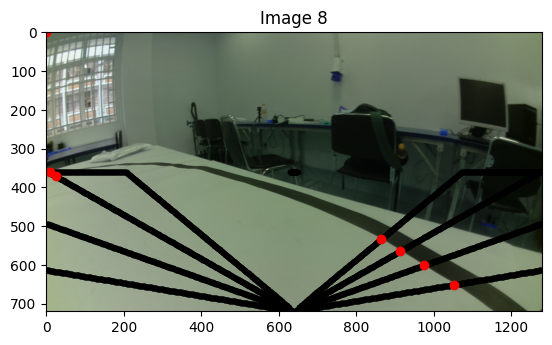

loaded image
time 0.06457220000447705


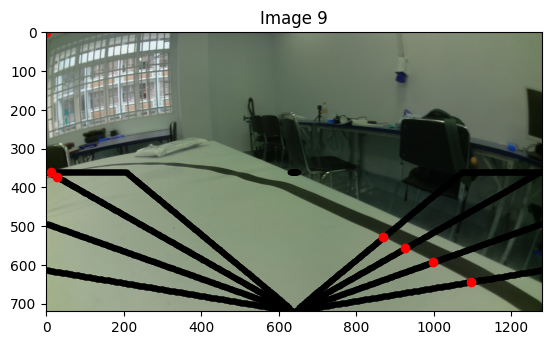

loaded image
time 0.09256010000535753


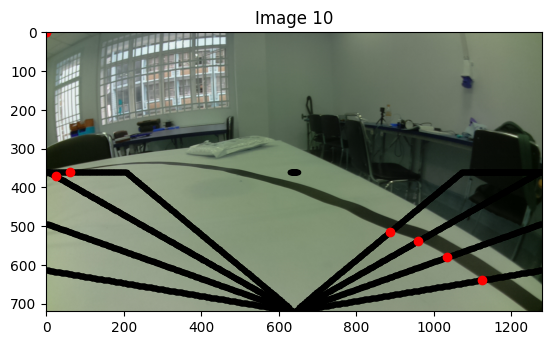

loaded image
time 0.060858500000904314


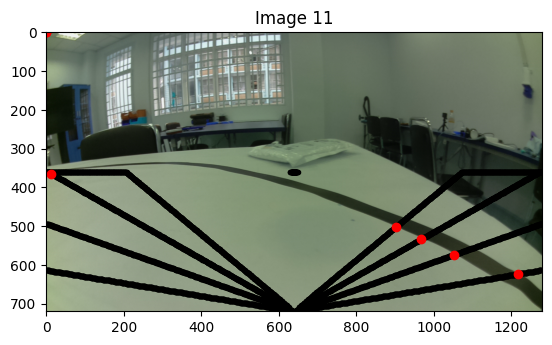

loaded image
time 0.052474700001766905


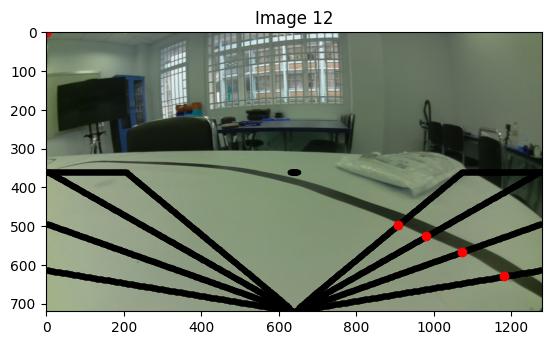

loaded image
time 0.0644962999940617


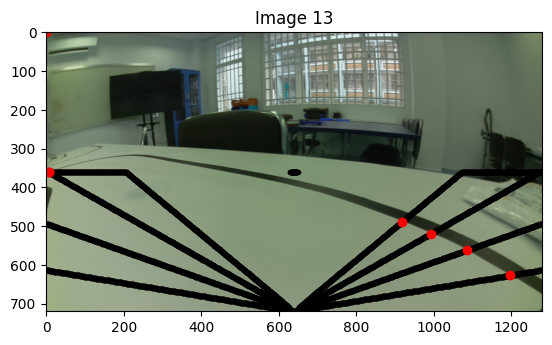

loaded image
time 0.05784259999927599


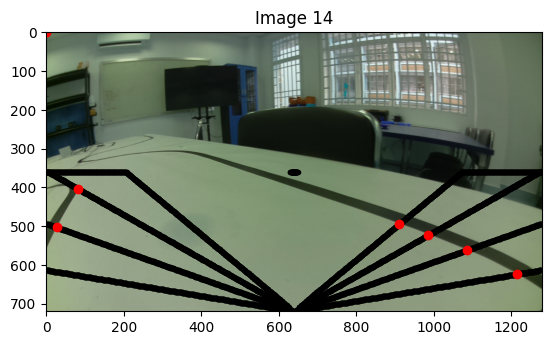

loaded image
time 0.06622209999477491


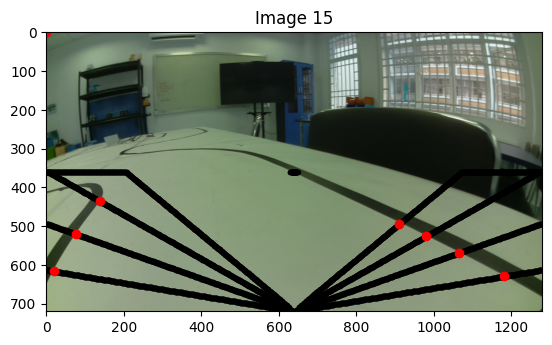

loaded image
time 0.05426060000900179


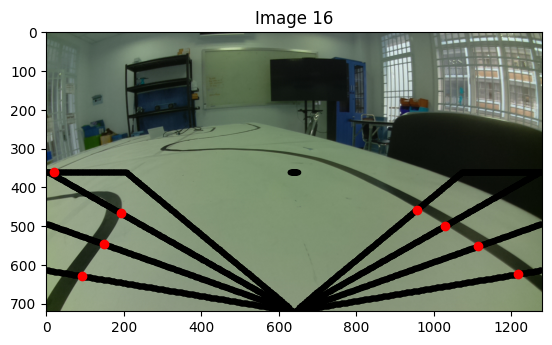

loaded image
time 0.11231250000128057


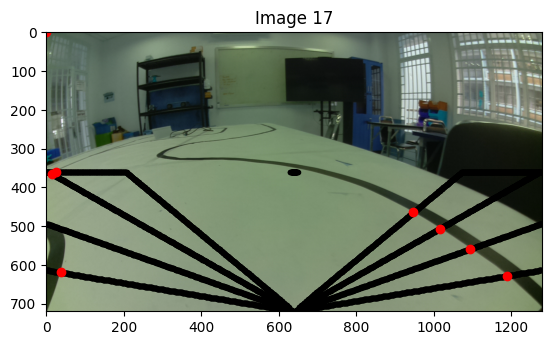

loaded image
time 0.06075059999420773


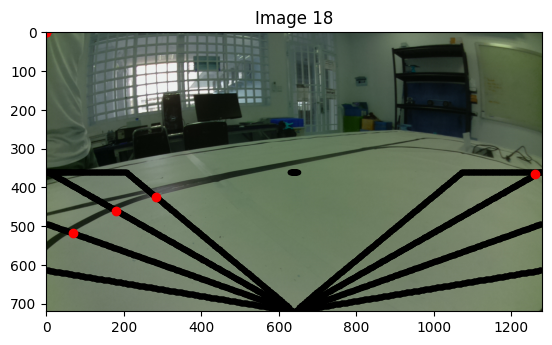

loaded image
time 0.10526820000086445


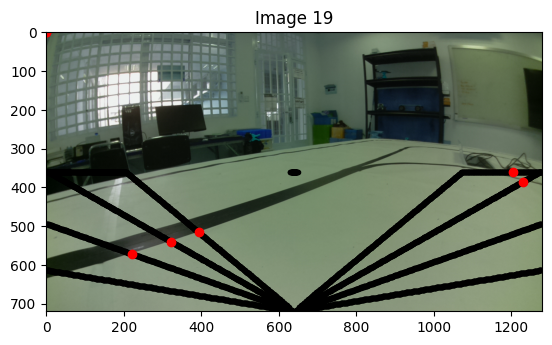

loaded image
time 0.07281919999513775


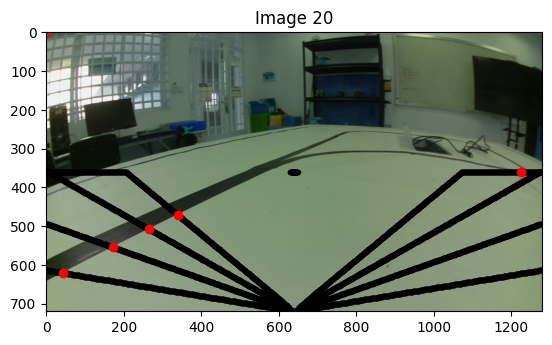

loaded image
time 0.0956278000085149


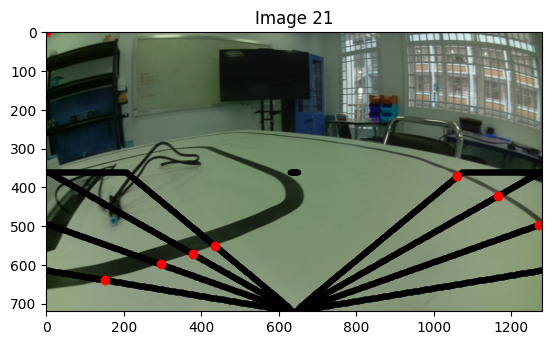

loaded image
time 0.04015250000520609


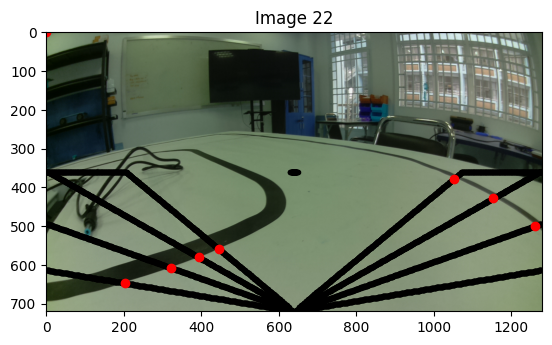

loaded image
time 0.0449324999935925


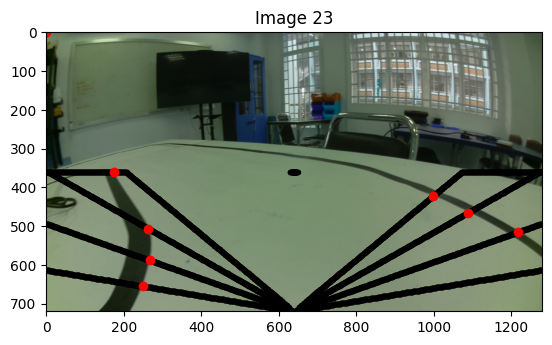

loaded image
time 0.049111700005596504


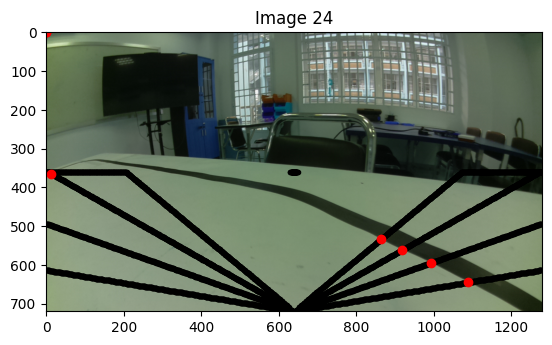

loaded image
time 0.06470259999332484


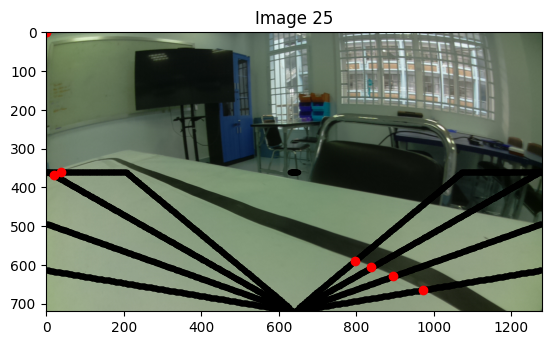

loaded image
time 0.10455750000255648


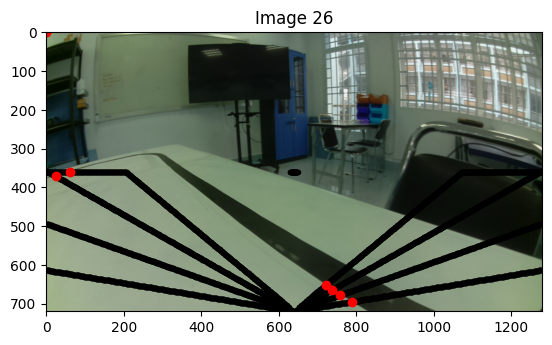

loaded image
time 0.06765369999629911


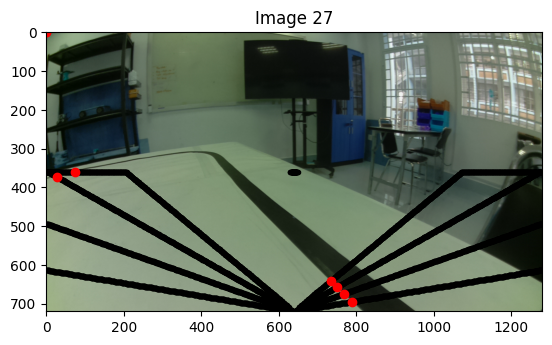

loaded image
time 0.06000270000367891


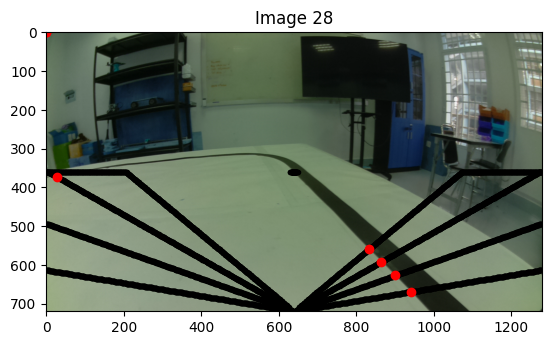

loaded image
time 0.06838260000222363


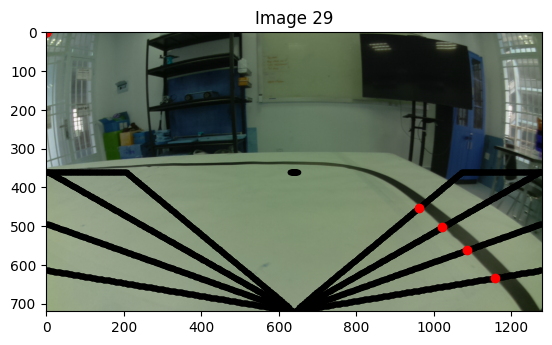

loaded image
time 0.07093640000675805


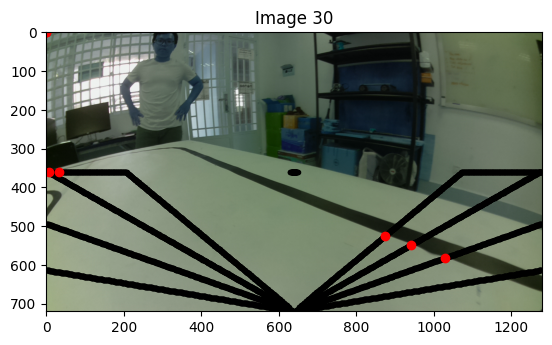

loaded image
time 0.07285419999971054


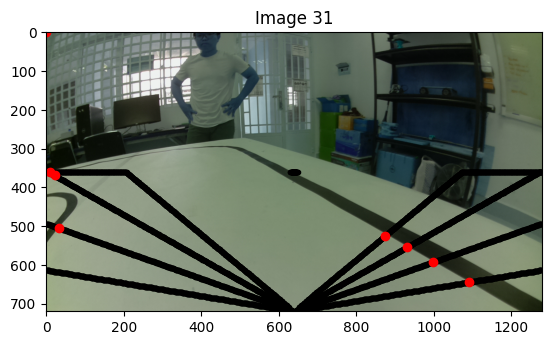

loaded image
time 0.08935049999854527


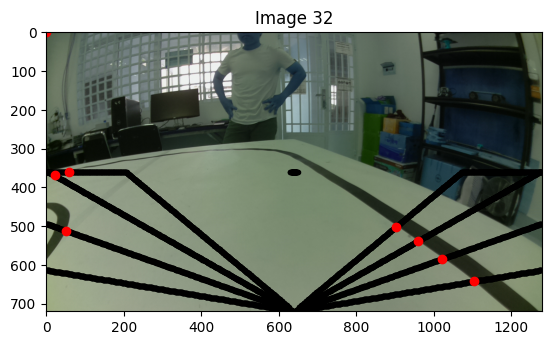

loaded image
time 0.06652600000961684


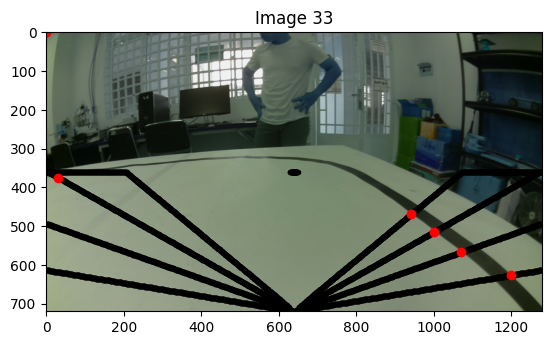

loaded image
time 0.07155740000598598


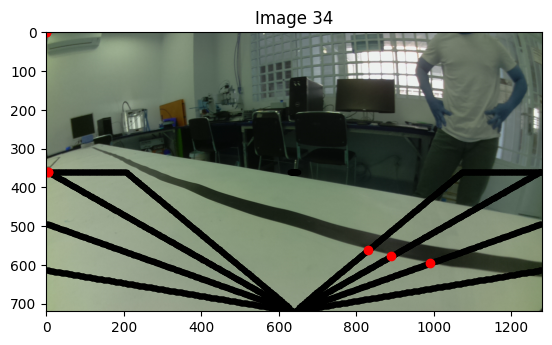

loaded image
time 0.08650750000379048


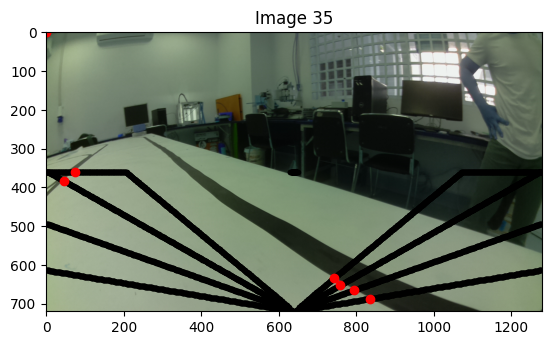

loaded image
time 0.07087350000801962


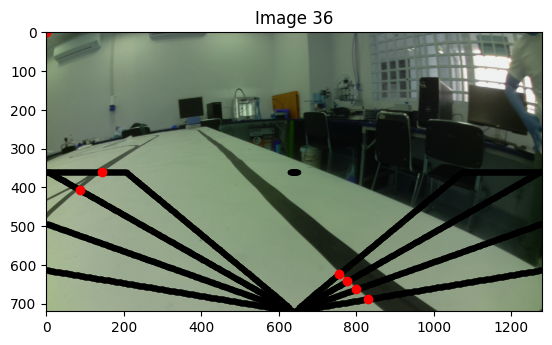

loaded image
time 0.08972210000501946


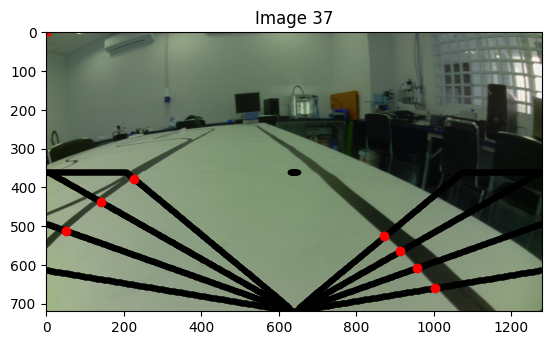

loaded image
time 0.06791780001367442


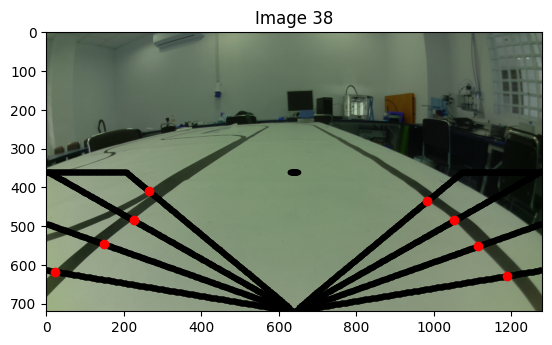

loaded image
time 0.06319080000685062


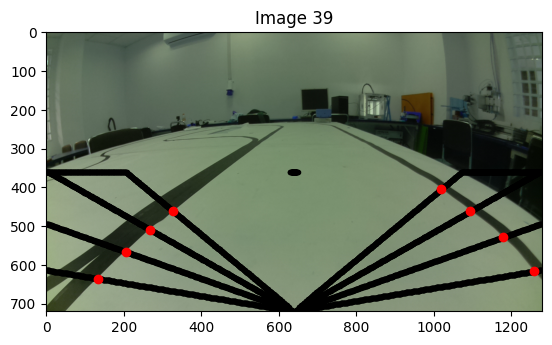

loaded image
time 0.07452999999804888


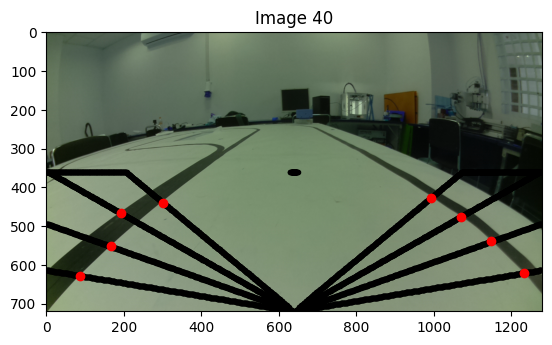

loaded image
time 0.08757319999858737


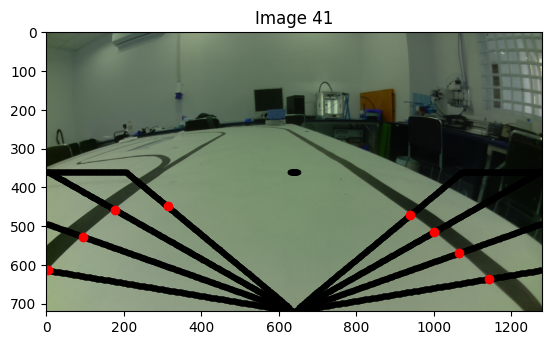

loaded image
time 0.3279700999992201


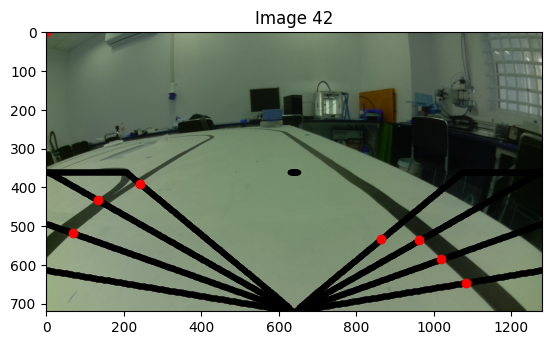

loaded image
time 0.0737090999900829


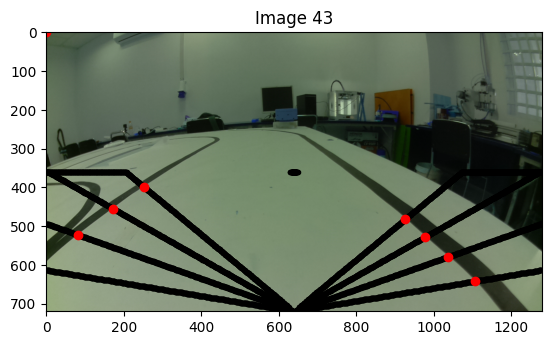

loaded image
time 0.06551539999782108


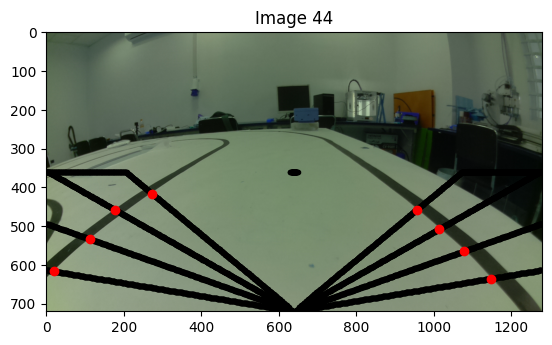

loaded image
time 0.06287259999953676


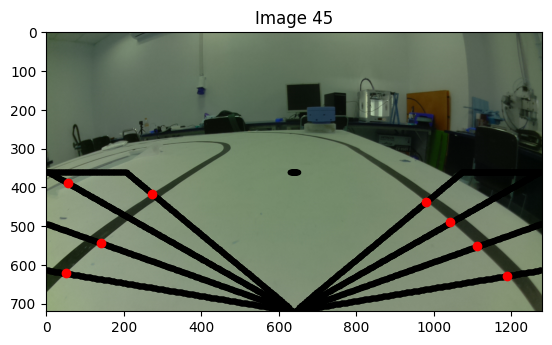

loaded image
time 0.05397399999492336


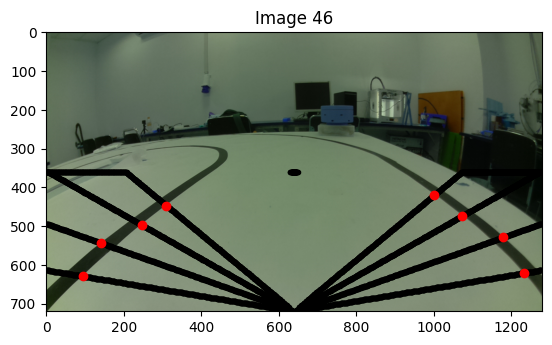

loaded image
time 0.06891650000761729


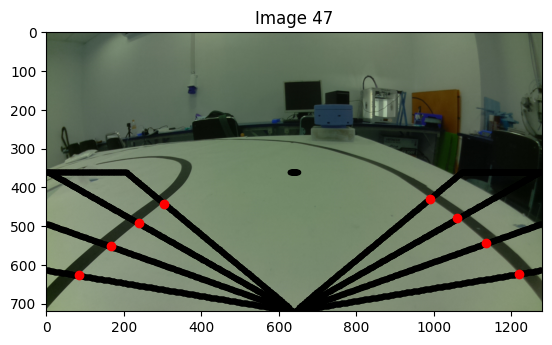

loaded image
time 0.08412260000477545


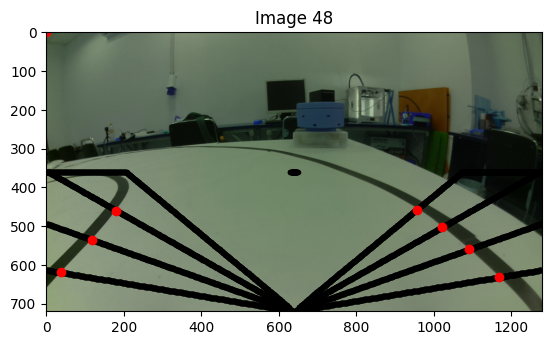

loaded image
time 0.08136340000783093


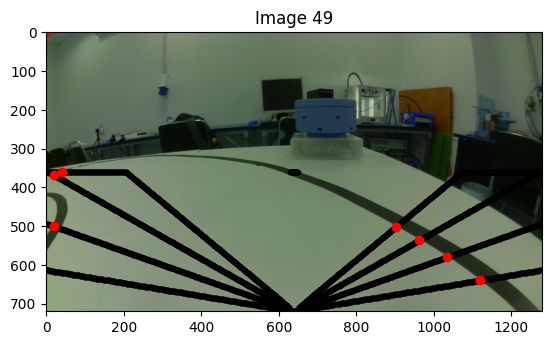

In [7]:
for i in range(0,50):
    t1 = timeit.default_timer()
    filename = "TestingImage/Image"+str(i)+".jpg"
    img1 = cv.imread(filename)
    img = img1[:,:,0]
    print("loaded image")
    data = frame1.get_data(img)
    kernal = np.array([-1,0,1])
    b = function2(data,kernal,0,20)  #19 or 20 sensitivity is the best performance
    print(f'time {timeit.default_timer()-t1}')
    ploting_onImage(b,frame1,img1,id=i)


In [116]:
"""This is the first method of boundary detection : 
- Using dot product
- going a single segment on all the line
"""
steps =+ data.size%(kernal.size+steps) #check if the step over board
t1 = timeit.default_timer()
for t in range(0,data.shape[0],kernal.size+steps):
    datas_segment = data[t:t+kernal.size,:]
    dot_result = kernal.dot(datas_segment)
    detection_result = np.argmax(np.where(np.abs(dot_result)> 50,1,0))
    #print(detection_result)
t2 = timeit.default_timer()
print(t2-t1)


0.009345999999823107


In [251]:
%timeit function2(data,kernal,steps)

3.8 ms ± 283 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [231]:
"""Second method of boundary detection:
- dot product
- Sweeping through 1 line at a time
- stop when boundary are found
"""
steps =+ data.size%(kernal.size+steps) #check if the step over board
t1 = timeit.default_timer()
boundary_index = []
for i in range(0,data.shape[1]):
    detection = False
    for t in range(0,data.shape[0],kernal.size+steps):
        datas_segment = data[t:t+kernal.size,i]
        dot_result = kernal.dot(datas_segment)
        #print(dot_result)
        if np.abs(dot_result) > 70:
            boundary_index += t,
            detection = True
            break
    if not detection:
        boundary_index += 0,
        detection = False
    #print(f"Line {i} done")
t2 = timeit.default_timer()
print(boundary_index)
print(t2-t1)

[315, 0, 325, 0, 210, 625, 170, 0]
0.008314400001836475


In [314]:
kernal=np.array([-1,0,1])
datas = data[0:3,0]
print(datas)
kernal.dot(datas)

[117 120 119]


2

In [423]:
steps = 3
kernal=np.array([-1,0,1])
reducts =(data.size-10)%(kernal.size+steps)
a = data.size-10
b = kernal.size+1
print(f'{a} % {b} = {a%b}')

print((data.size-10-reducts)%(kernal.size+steps))


5108 % 4 = 0
0


In [424]:
a = np.empty([0,0])
for i in range(5,data.size):
    a= np.append(a,i)
print(data.size-5)

print(a.size%(kernal.size+1))

5115
3
